In [1]:
%matplotlib inline
#%matplotlib widget
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.patches import Ellipse
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from sklearn.mixture import GaussianMixture as GMM

from scipy.spatial.distance import cdist

from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster import hierarchy
from sklearn.cluster import KMeans
from sklearn.metrics import  silhouette_score


from yellowbrick.cluster import SilhouetteVisualizer
from yellowbrick.cluster import KElbowVisualizer

from sklearn.mixture import GaussianMixture

from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
import hypertools as hyp

from collections import Counter

'''Set plotting parameters'''
plt.rcParams['figure.figsize'] = (16, 9)
plt.style.use('ggplot')
pd.options.display.max_columns = None

# DATA CLEANING -PREPARATION

In [2]:
data = pd.read_csv('data-final.csv', delimiter='\t')
data.head()

,EXT1,EXT2,EXT3,EXT4,EXT5,EXT6,EXT7,EXT8,EXT9,EXT10,EST1,EST2,EST3,EST4,EST5,EST6,EST7,EST8,EST9,EST10,AGR1,AGR2,AGR3,AGR4,AGR5,AGR6,AGR7,AGR8,AGR9,AGR10,CSN1,CSN2,CSN3,CSN4,CSN5,CSN6,CSN7,CSN8,CSN9,CSN10,OPN1,OPN2,OPN3,OPN4,OPN5,OPN6,OPN7,OPN8,OPN9,OPN10,EXT1_E,EXT2_E,EXT3_E,EXT4_E,EXT5_E,EXT6_E,EXT7_E,EXT8_E,EXT9_E,EXT10_E,EST1_E,EST2_E,EST3_E,EST4_E,EST5_E,EST6_E,EST7_E,EST8_E,EST9_E,EST10_E,AGR1_E,AGR2_E,AGR3_E,AGR4_E,AGR5_E,AGR6_E,AGR7_E,AGR8_E,AGR9_E,AGR10_E,CSN1_E,CSN2_E,CSN3_E,CSN4_E,CSN5_E,CSN6_E,CSN7_E,CSN8_E,CSN9_E,CSN10_E,OPN1_E,OPN2_E,OPN3_E,OPN4_E,OPN5_E,OPN6_E,OPN7_E,OPN8_E,OPN9_E,OPN10_E,dateload,screenw,screenh,introelapse,testelapse,endelapse,IPC,country,lat_appx_lots_of_err,long_appx_lots_of_err
0,4.0,1.0,5.0,2.0,5.0,1.0,5.0,2.0,4.0,1.0,1.0,4.0,4.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,2.0,5.0,2.0,4.0,2.0,3.0,2.0,4.0,3.0,4.0,3.0,4.0,3.0,2.0,2.0,4.0,4.0,2.0,4.0,4.0,5.0,1.0,4.0,1.0,4.0,1.0,5.0,3.0,4.0,5.0,9419.0,5491.0,3959.0,4821.0,5611.0,2756.0,2388.0,2113.0,5900.0,4110.0,6135.0,4150.0,5739.0,6364.0,3663.0,5070.0,5709.0,4285.0,2587.0,3997.0,4750.0,5475.0,11641.0,3115.0,3207.0,3260.0,10235.0,5897.0,1758.0,3081.0,6602.0,5457.0,1569.0,2129.0,3762.0,4420.0,9382.0,5286.0,4983.0,6339.0,3146.0,4067.0,2959.0,3411.0,2170.0,4920.0,4436.0,3116.0,2992.0,4354.0,2016-03-03 02:01:01,768.0,1024.0,9.0,234.0,6,1,GB,51.5448,0.1991
1,3.0,5.0,3.0,4.0,3.0,3.0,2.0,5.0,1.0,5.0,2.0,3.0,4.0,1.0,3.0,1.0,2.0,1.0,3.0,1.0,1.0,4.0,1.0,5.0,1.0,5.0,3.0,4.0,5.0,3.0,3.0,2.0,5.0,3.0,3.0,1.0,3.0,3.0,5.0,3.0,1.0,2.0,4.0,2.0,3.0,1.0,4.0,2.0,5.0,3.0,7235.0,3598.0,3315.0,2564.0,2976.0,3050.0,4787.0,3228.0,3465.0,3309.0,9036.0,2406.0,3484.0,3359.0,3061.0,2539.0,4226.0,2962.0,1799.0,1607.0,2158.0,2090.0,2143.0,2807.0,3422.0,5324.0,4494.0,3627.0,1850.0,1747.0,5163.0,5240.0,7208.0,2783.0,4103.0,3431.0,3347.0,2399.0,3360.0,5595.0,2624.0,4985.0,1684.0,3026.0,4742.0,3336.0,2718.0,3374.0,3096.0,3019.0,2016-03-03 02:01:20,1360.0,768.0,12.0,179.0,11,1,MY,3.1698,101.706
2,2.0,3.0,4.0,4.0,3.0,2.0,1.0,3.0,2.0,5.0,4.0,4.0,4.0,2.0,2.0,2.0,2.0,2.0,1.0,3.0,1.0,4.0,1.0,4.0,2.0,4.0,1.0,4.0,4.0,3.0,4.0,2.0,2.0,2.0,3.0,3.0,4.0,2.0,4.0,2.0,5.0,1.0,2.0,1.0,4.0,2.0,5.0,3.0,4.0,4.0,4657.0,3549.0,2543.0,3335.0,5847.0,2540.0,4922.0,3142.0,14621.0,2191.0,5128.0,3675.0,3442.0,4546.0,8275.0,2185.0,2164.0,1175.0,3813.0,1593.0,1089.0,2203.0,3386.0,1464.0,2562.0,1493.0,3067.0,13719.0,3892.0,4100.0,4286.0,4775.0,2713.0,2813.0,4237.0,6308.0,2690.0,1516.0,2379.0,2983.0,1930.0,1470.0,1644.0,1683.0,2229.0,8114.0,2043.0,6295.0,1585.0,2529.0,2016-03-03 02:01:56,1366.0,768.0,3.0,186.0,7,1,GB,54.9119,-1.3833
3,2.0,2.0,2.0,3.0,4.0,2.0,2.0,4.0,1.0,4.0,3.0,3.0,3.0,2.0,3.0,2.0,2.0,2.0,4.0,3.0,2.0,4.0,3.0,4.0,2.0,4.0,2.0,4.0,3.0,4.0,2.0,4.0,4.0,4.0,1.0,2.0,2.0,3.0,1.0,4.0,4.0,2.0,5.0,2.0,3.0,1.0,4.0,4.0,3.0,3.0,3996.0,2896.0,5096.0,4240.0,5168.0,5456.0,4360.0,4496.0,5240.0,4000.0,3736.0,4616.0,3015.0,2711.0,3960.0,4064.0,4208.0,2936.0,7336.0,3896.0,6062.0,11952.0,1040.0,2264.0,3664.0,3049.0,4912.0,7545.0,4632.0,6896.0,2824.0,520.0,2368.0,3225.0,2848.0,6264.0,3760.0,10472.0,3192.0,7704.0,3456.0,6665.0,1977.0,3728.0,4128.0,3776.0,2984.0,4192.0,3480.0,3257.0,2016-03-03 02:02:02,1920.0,1200.0,186.0,219.0,7,1,GB,51.75,-1.25
4,3.0,3.0,3.0,3.0,5.0,3.0,3.0,5.0,3.0,4.0,1.0,5.0,5.0,3.0,1.0,1.0,1.0,1.0,3.0,2.0,1.0,5.0,1.0,5.0,1.0,3.0,1.0,5.0,5.0,3.0,5.0,1.0,5.0,1.0,3.0,1.0,5.0,1.0,5.0,5.0,5.0,1.0,5.0,1.0,5.0,1.0,5.0,3.0,5.0,5.0,6004.0,3965.0,2721.0,3706.0,2968.0,2426.0,7339.0,3302.0,16819.0,3731.0,4740.0,2856.0,7461.0,2179.0,3324.0,2255.0,4308.0,4506.0,3127.0,3115.0,6771.0,2819.0,3682.0,2511.0,16204.0,1736.0,28983.0,1612.0,2437.0,4532.0,3843.0,7019.0,3102.0,3153.0,2869.0,6550.0,1811.0,3682.0,21500.0,20587.0,8458.0,3510.0,17042.0,7029.0,2327.0,5835.0,6846.0,5320.0,11401.0,8642.0,2016-03-03 02:02:57,1366.0,768.0,8.0,315.0,17,2,KE,1.0,38.0


In [3]:
personalities = {
    'EXT': 'Extroversion',
    'AGR': 'Agreeableness',
    'CSN': 'Conscientiousness',
    'EST': 'Neuroticism',
    'OPN': 'Openness to Experience'
}

In [4]:
names = {'EXT1' : 'I am the life of the party',
                 'EXT2' : 'I dont talk a lot',
                 'EXT3' : 'I feel comfortable around people',
                 'EXT4' : 'I keep in the background',
                 'EXT5' : 'I start conversations',
                 'EXT6' : 'I have little to say',
                 'EXT7' : 'I talk to a lot of different people at parties',
                 'EXT8' : 'I dont like to draw attention to myself',
                 'EXT9' : 'I dont mind being the center of attention',
                 'EXT10' : 'I am quiet around strangers.',
                 'EST1' : 'I get stressed out easily',
                 'EST2' : 'I am relaxed most of the time',
                 'EST3' : 'I worry about things',
                 'EST4' : 'I seldom feel blue',
                 'EST5' : 'I am easily disturbed',
                 'EST6' : 'I get upset easily',
                 'EST7' : 'I change my mood a lot',
                 'EST8' : 'I have frequent mood swings',
                 'EST9' : 'I get irritated easily',
                 'EST10': 'I often feel blue',
                 'AGR1' : 'I feel little concern for others',
                 'AGR2' : 'I am interested in people',
                 'AGR3' : 'I insult people',
                 'AGR4' : 'I sympathize with others feelings',
                 'AGR5' : 'I am not interested in other peoples problems',
                 'AGR6' : 'I have a soft heart',
                 'AGR7' : 'I am not really interested in others',
                 'AGR8' : 'I take time out for others',
                 'AGR9' : 'I feel others emotions',
                 'AGR10': 'I make people feel at ease',
                 'CSN1' : 'I am always prepared',
                 'CSN2' : 'I leave my belongings around',
                 'CSN3' : 'I pay attention to details',
                 'CSN4' : 'I make a mess of things',
                 'CSN5' : 'I get chores done right away',
                 'CSN6' : 'I often forget to put things back in their proper place',
                 'CSN7' : 'I like order',
                 'CSN8' : 'I shirk my duties',
                 'CSN9' : 'I follow a schedule',
                'CSN10'	: 'I am exacting in my work.',
                 'OPN1' : 'I have a rich vocabulary',
                 'OPN2' : 'I have difficulty understanding abstract ideas',
                 'OPN3' : 'I have a vivid imagination',
                 'OPN4' : 'I am not interested in abstract ideas',
                 'OPN5' : 'I have excellent ideas',
                 'OPN6' : 'I do not have a good imagination',
                 'OPN7' : 'I am quick to understand things',
                 'OPN8' : 'I use difficult words',
                 'OPN9' : 'I spend time reflecting on things',
                 'OPN10': 'I am full of ideas'}

In [5]:
for name in names.keys():
    data = data.rename({name: names[name]}, axis=1)

In [6]:
data.head()

,I am the life of the party,I dont talk a lot,I feel comfortable around people,I keep in the background,I start conversations,I have little to say,I talk to a lot of different people at parties,I dont like to draw attention to myself,I dont mind being the center of attention,I am quiet around strangers.,I get stressed out easily,I am relaxed most of the time,I worry about things,I seldom feel blue,I am easily disturbed,I get upset easily,I change my mood a lot,I have frequent mood swings,I get irritated easily,I often feel blue,I feel little concern for others,I am interested in people,I insult people,I sympathize with others feelings,I am not interested in other peoples problems,I have a soft heart,I am not really interested in others,I take time out for others,I feel others emotions,I make people feel at ease,I am always prepared,I leave my belongings around,I pay attention to details,I make a mess of things,I get chores done right away,I often forget to put things back in their proper place,I like order,I shirk my duties,I follow a schedule,I am exacting in my work.,I have a rich vocabulary,I have difficulty understanding abstract ideas,I have a vivid imagination,I am not interested in abstract ideas,I have excellent ideas,I do not have a good imagination,I am quick to understand things,I use difficult words,I spend time reflecting on things,I am full of ideas,EXT1_E,EXT2_E,EXT3_E,EXT4_E,EXT5_E,EXT6_E,EXT7_E,EXT8_E,EXT9_E,EXT10_E,EST1_E,EST2_E,EST3_E,EST4_E,EST5_E,EST6_E,EST7_E,EST8_E,EST9_E,EST10_E,AGR1_E,AGR2_E,AGR3_E,AGR4_E,AGR5_E,AGR6_E,AGR7_E,AGR8_E,AGR9_E,AGR10_E,CSN1_E,CSN2_E,CSN3_E,CSN4_E,CSN5_E,CSN6_E,CSN7_E,CSN8_E,CSN9_E,CSN10_E,OPN1_E,OPN2_E,OPN3_E,OPN4_E,OPN5_E,OPN6_E,OPN7_E,OPN8_E,OPN9_E,OPN10_E,dateload,screenw,screenh,introelapse,testelapse,endelapse,IPC,country,lat_appx_lots_of_err,long_appx_lots_of_err
0,4.0,1.0,5.0,2.0,5.0,1.0,5.0,2.0,4.0,1.0,1.0,4.0,4.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,2.0,5.0,2.0,4.0,2.0,3.0,2.0,4.0,3.0,4.0,3.0,4.0,3.0,2.0,2.0,4.0,4.0,2.0,4.0,4.0,5.0,1.0,4.0,1.0,4.0,1.0,5.0,3.0,4.0,5.0,9419.0,5491.0,3959.0,4821.0,5611.0,2756.0,2388.0,2113.0,5900.0,4110.0,6135.0,4150.0,5739.0,6364.0,3663.0,5070.0,5709.0,4285.0,2587.0,3997.0,4750.0,5475.0,11641.0,3115.0,3207.0,3260.0,10235.0,5897.0,1758.0,3081.0,6602.0,5457.0,1569.0,2129.0,3762.0,4420.0,9382.0,5286.0,4983.0,6339.0,3146.0,4067.0,2959.0,3411.0,2170.0,4920.0,4436.0,3116.0,2992.0,4354.0,2016-03-03 02:01:01,768.0,1024.0,9.0,234.0,6,1,GB,51.5448,0.1991
1,3.0,5.0,3.0,4.0,3.0,3.0,2.0,5.0,1.0,5.0,2.0,3.0,4.0,1.0,3.0,1.0,2.0,1.0,3.0,1.0,1.0,4.0,1.0,5.0,1.0,5.0,3.0,4.0,5.0,3.0,3.0,2.0,5.0,3.0,3.0,1.0,3.0,3.0,5.0,3.0,1.0,2.0,4.0,2.0,3.0,1.0,4.0,2.0,5.0,3.0,7235.0,3598.0,3315.0,2564.0,2976.0,3050.0,4787.0,3228.0,3465.0,3309.0,9036.0,2406.0,3484.0,3359.0,3061.0,2539.0,4226.0,2962.0,1799.0,1607.0,2158.0,2090.0,2143.0,2807.0,3422.0,5324.0,4494.0,3627.0,1850.0,1747.0,5163.0,5240.0,7208.0,2783.0,4103.0,3431.0,3347.0,2399.0,3360.0,5595.0,2624.0,4985.0,1684.0,3026.0,4742.0,3336.0,2718.0,3374.0,3096.0,3019.0,2016-03-03 02:01:20,1360.0,768.0,12.0,179.0,11,1,MY,3.1698,101.706
2,2.0,3.0,4.0,4.0,3.0,2.0,1.0,3.0,2.0,5.0,4.0,4.0,4.0,2.0,2.0,2.0,2.0,2.0,1.0,3.0,1.0,4.0,1.0,4.0,2.0,4.0,1.0,4.0,4.0,3.0,4.0,2.0,2.0,2.0,3.0,3.0,4.0,2.0,4.0,2.0,5.0,1.0,2.0,1.0,4.0,2.0,5.0,3.0,4.0,4.0,4657.0,3549.0,2543.0,3335.0,5847.0,2540.0,4922.0,3142.0,14621.0,2191.0,5128.0,3675.0,3442.0,4546.0,8275.0,2185.0,2164.0,1175.0,3813.0,1593.0,1089.0,2203.0,3386.0,1464.0,2562.0,1493.0,3067.0,13719.0,3892.0,4100.0,4286.0,4775.0,2713.0,2813.0,4237.0,6308.0,2690.0,1516.0,2379.0,2983.0,1930.0,1470.0,1644.0,1683.0,2229.0,8114.0,2043.0,6295.0,1585.0,2529.0,2016-03-03 02:01:56,1366.0,768.0,3.0,186.0,7,1,GB,54.9119,-1.3833
3,2.0,2.0,2.0,3.0,4.0,2.0,2.0,4.0,1.0,4.0,3.0,3.0,3.0,2.0,3.0,2.0,2.0,2.0,4.0,3.0,2.0,4.0,3.0,4.0,2.0,4.0,2.0,4.0,3.0,4.0,2.0,4.0,4.0,4.0,1.0,2.0,2.0,3.0,1.0,4.0,4.0,2.0,5.0,2.0,3.0,1.0,4.0,4.0,3.0,3.0,3996.0,2896.0,5096.0,4240.0,5168.0,5456.0,4360.0,4496.0,5240.0,4000.0,3736.0,4616.0,30

In [7]:
new_data = data.drop(data.columns[50:107],axis =1)
new_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1015341 entries, 0 to 1015340
Data columns (total 53 columns):
 #   Column                                                   Non-Null Count    Dtype  
---  ------                                                   --------------    -----  
 0   I am the life of the party                               1013558 non-null  float64
 1   I dont talk a lot                                        1013558 non-null  float64
 2   I feel comfortable around people                         1013558 non-null  float64
 3   I keep in the background                                 1013558 non-null  float64
 4   I start conversations                                    1013558 non-null  float64
 5   I have little to say                                     1013558 non-null  float64
 6   I talk to a lot of different people at parties           1013558 non-null  float64
 7   I dont like to draw attention to myself                  1013558 non-null  float64
 8   I 

In [8]:
new_data.drop(['lat_appx_lots_of_err','long_appx_lots_of_err'],axis =1,inplace=True)

In [9]:
new_data.isnull().sum()

I am the life of the party                                 1783
I dont talk a lot                                          1783
I feel comfortable around people                           1783
I keep in the background                                   1783
I start conversations                                      1783
I have little to say                                       1783
I talk to a lot of different people at parties             1783
I dont like to draw attention to myself                    1783
I dont mind being the center of attention                  1783
I am quiet around strangers.                               1783
I get stressed out easily                                  1783
I am relaxed most of the time                              1783
I worry about things                                       1783
I seldom feel blue                                         1783
I am easily disturbed                                      1783
I get upset easily                      

In [10]:
new_data.dropna(inplace=True)
new_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1013481 entries, 0 to 1015340
Data columns (total 51 columns):
 #   Column                                                   Non-Null Count    Dtype  
---  ------                                                   --------------    -----  
 0   I am the life of the party                               1013481 non-null  float64
 1   I dont talk a lot                                        1013481 non-null  float64
 2   I feel comfortable around people                         1013481 non-null  float64
 3   I keep in the background                                 1013481 non-null  float64
 4   I start conversations                                    1013481 non-null  float64
 5   I have little to say                                     1013481 non-null  float64
 6   I talk to a lot of different people at parties           1013481 non-null  float64
 7   I dont like to draw attention to myself                  1013481 non-null  float64
 8   I dont 

In [11]:
new_data.shape

(1013481, 51)

In [12]:
new_data.country.nunique()

223

In [13]:
new_data.country.value_counts().head(20)

country
US      545912
GB       66487
CA       61805
AU       49753
PH       19844
IN       17482
DE       14084
NONE     13721
NZ       12988
MY       11347
MX       11057
NO       10970
SE       10477
NL        9777
SG        7647
ID        6489
BR        6241
FR        6140
DK        5501
IE        5408
Name: count, dtype: int64

In [14]:
#dataframe for clustering

In [15]:
X = new_data.drop(['country'],axis=1)
X.head()

,I am the life of the party,I dont talk a lot,I feel comfortable around people,I keep in the background,I start conversations,I have little to say,I talk to a lot of different people at parties,I dont like to draw attention to myself,I dont mind being the center of attention,I am quiet around strangers.,I get stressed out easily,I am relaxed most of the time,I worry about things,I seldom feel blue,I am easily disturbed,I get upset easily,I change my mood a lot,I have frequent mood swings,I get irritated easily,I often feel blue,I feel little concern for others,I am interested in people,I insult people,I sympathize with others feelings,I am not interested in other peoples problems,I have a soft heart,I am not really interested in others,I take time out for others,I feel others emotions,I make people feel at ease,I am always prepared,I leave my belongings around,I pay attention to details,I make a mess of things,I get chores done right away,I often forget to put things back in their proper place,I like order,I shirk my duties,I follow a schedule,I am exacting in my work.,I have a rich vocabulary,I have difficulty understanding abstract ideas,I have a vivid imagination,I am not interested in abstract ideas,I have excellent ideas,I do not have a good imagination,I am quick to understand things,I use difficult words,I spend time reflecting on things,I am full of ideas
0,4.0,1.0,5.0,2.0,5.0,1.0,5.0,2.0,4.0,1.0,1.0,4.0,4.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,2.0,5.0,2.0,4.0,2.0,3.0,2.0,4.0,3.0,4.0,3.0,4.0,3.0,2.0,2.0,4.0,4.0,2.0,4.0,4.0,5.0,1.0,4.0,1.0,4.0,1.0,5.0,3.0,4.0,5.0
1,3.0,5.0,3.0,4.0,3.0,3.0,2.0,5.0,1.0,5.0,2.0,3.0,4.0,1.0,3.0,1.0,2.0,1.0,3.0,1.0,1.0,4.0,1.0,5.0,1.0,5.0,3.0,4.0,5.0,3.0,3.0,2.0,5.0,3.0,3.0,1.0,3.0,3.0,5.0,3.0,1.0,2.0,4.0,2.0,3.0,1.0,4.0,2.0,5.0,3.0
2,2.0,3.0,4.0,4.0,3.0,2.0,1.0,3.0,2.0,5.0,4.0,4.0,4.0,2.0,2.0,2.0,2.0,2.0,1.0,3.0,1.0,4.0,1.0,4.0,2.0,4.0,1.0,4.0,4.0,3.0,4.0,2.0,2.0,2.0,3.0,3.0,4.0,2.0,4.0,2.0,5.0,1.0,2.0,1.0,4.0,2.0,5.0,3.0,4.0,4.0
3,2.0,2.0,2.0,3.0,4.0,2.0,2.0,4.0,1.0,4.0,3.0,3.0,3.0,2.0,3.0,2.0,2.0,2.0,4.0,3.0,2.0,4.0,3.0,4.0,2.0,4.0,2.0,4.0,3.0,4.0,2.0,4.0,4.0,4.0,1.0,2.0,2.0,3.0,1.0,4.0,4.0,2.0,5.0,2.0,3.0,1.0,4.0,4.0,3.0,3.0
4,3.0,3.0,3.0,3.0,5.0,3.0,3.0,5.0,3.0,4.0,1.0,5.0,5.0,3.0,1.0,1.0,1.0,1.0,3.0,2.0,1.0,5.0,1.0,5.0,1.0,3.0,1.0,5.0,5.0,3.0,5.0,1.0,5.0,1.0,3.0,1.0,5.0,1.0,5.0,5.0,5.0,1.0,5.0,1.0,5.0,1.0,5.0,3.0,5.0,5.0


In [16]:
#no need for scaling

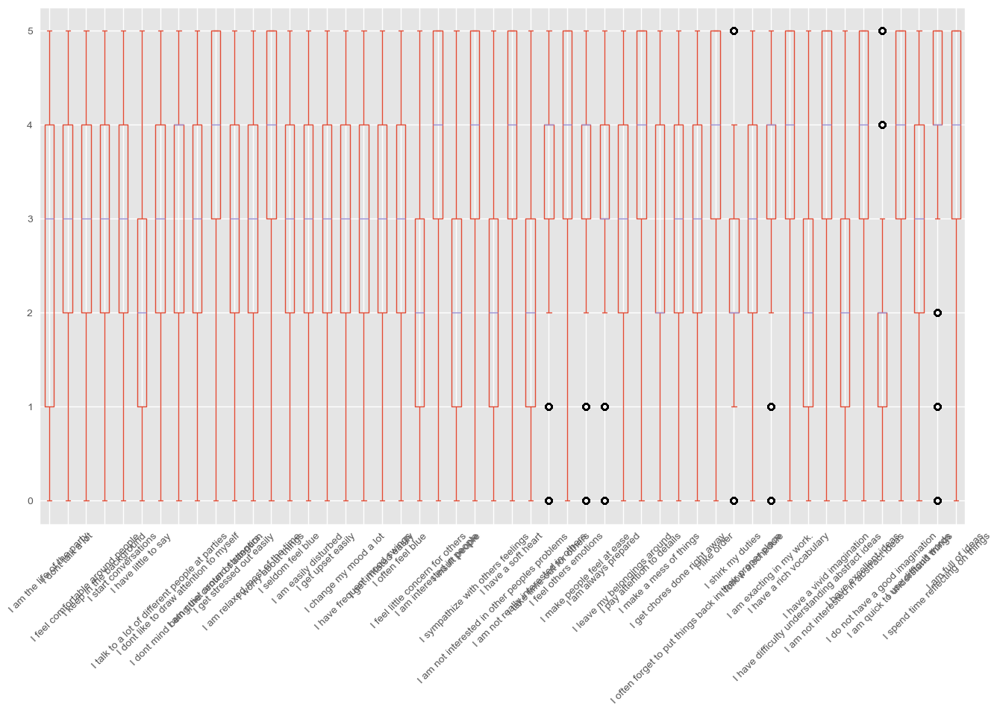

In [17]:
X.plot(kind='box',rot = 45)
None

<Axes: >

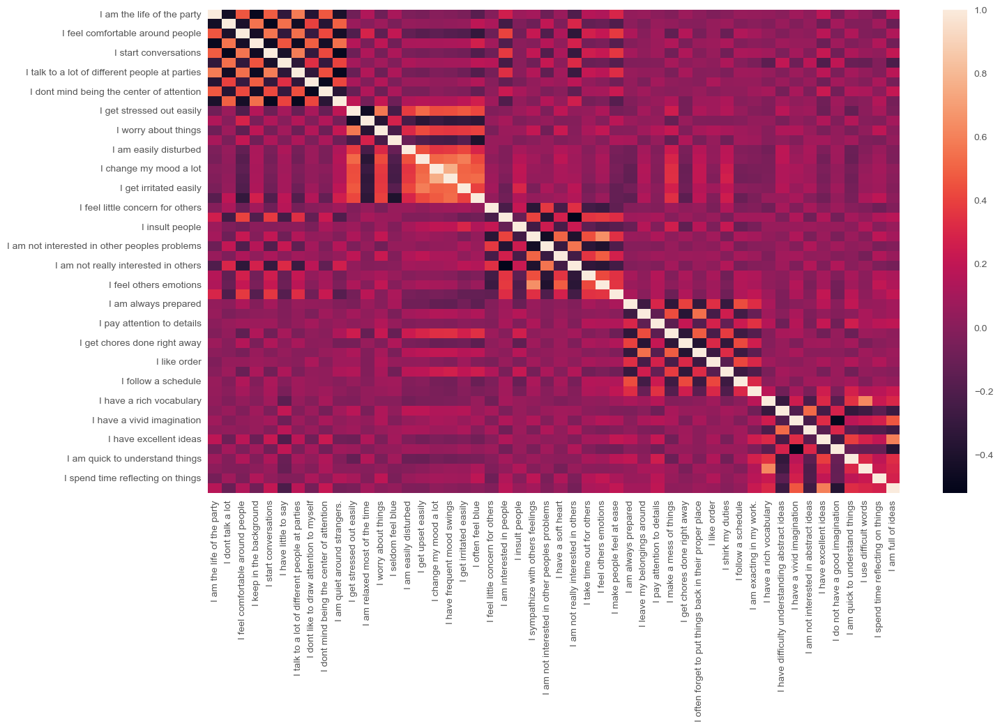

In [18]:
corr = X.corr()
sns.heatmap(corr)

In [19]:
# at first glance we observe 5 clusters

# K-means

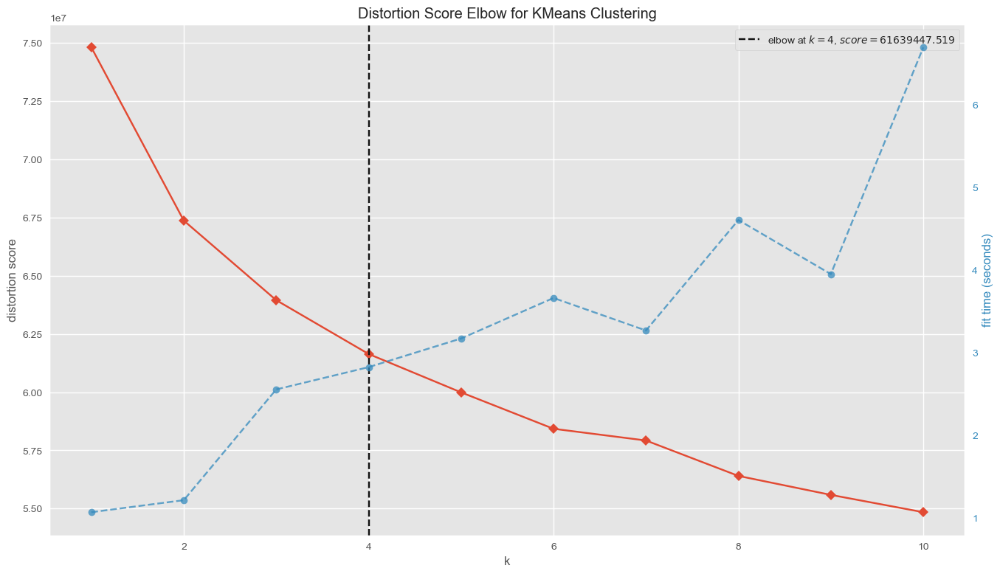

In [20]:
# Instantiate the clustering model and visualizer
model = KMeans(n_init='auto')
visualizer = KElbowVisualizer(model, k=(1,11), locate_elbow=True)

visualizer.fit(X)        # Fit the data to the visualizer
visualizer.poof()        # Draw/show/poof the data
plt.show()

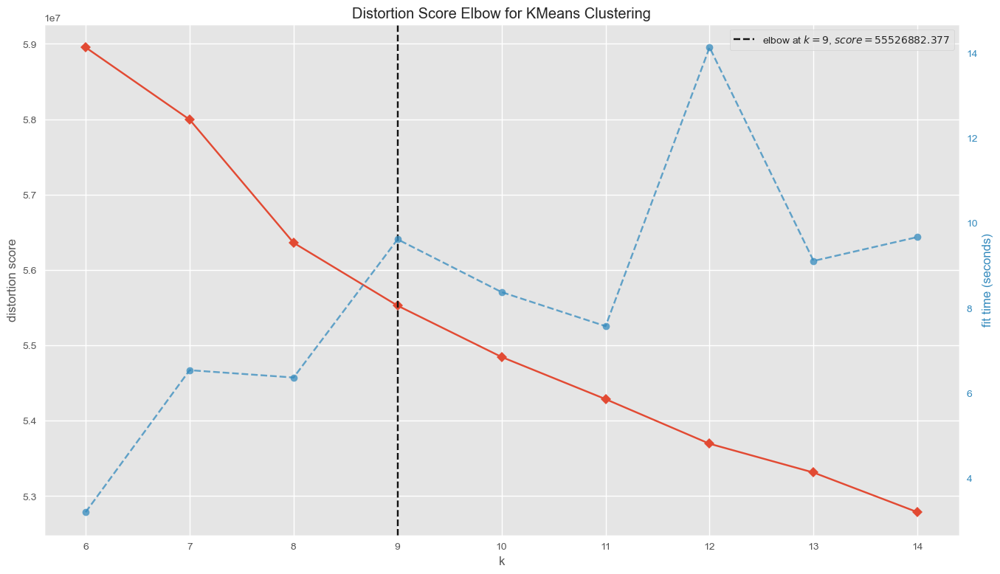

In [21]:
# Instantiate the clustering model and visualizer
model = KMeans(n_init='auto')
visualizer = KElbowVisualizer(model, k=(6,15), locate_elbow=True)

visualizer.fit(X)        # Fit the data to the visualizer
visualizer.poof()        # Draw/show/poof the data
plt.show()

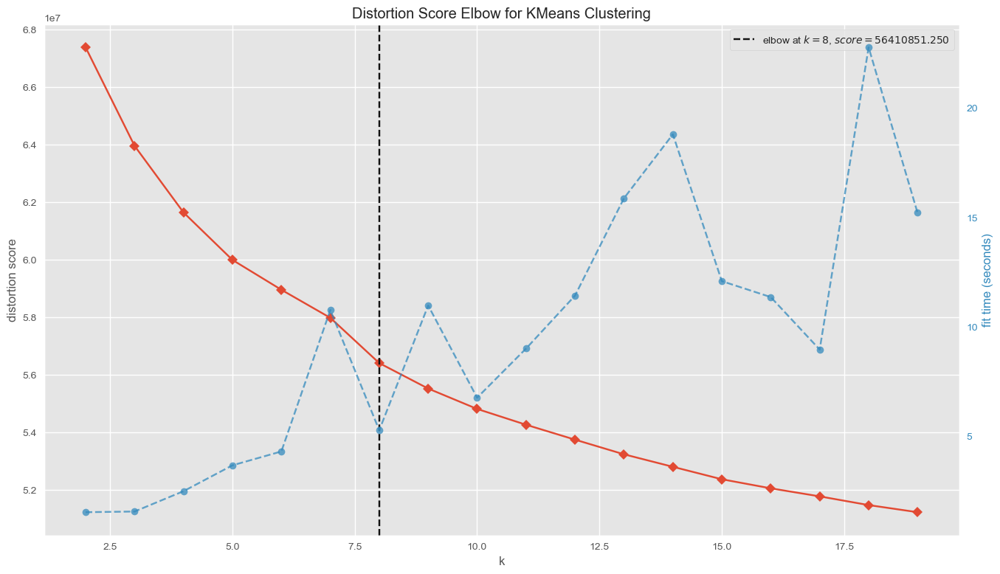

In [22]:
# Instantiate the clustering model and visualizer
model = KMeans(n_init='auto')
visualizer = KElbowVisualizer(model, k=(2,20), locate_elbow=True)

visualizer.fit(X)        # Fit the data to the visualizer
visualizer.poof()        # Draw/show/poof the data
plt.show()

In [23]:
sample = X.sample(n = 20000)

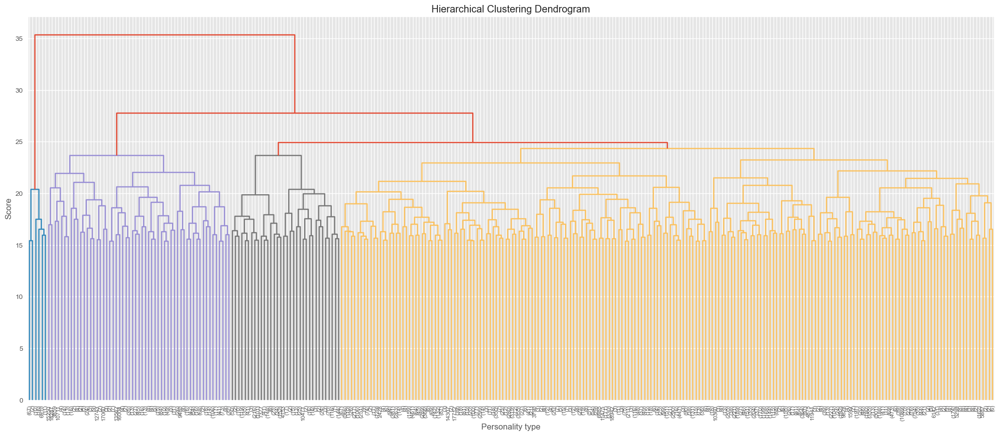

In [24]:
'''generate the linkage matrix'''
Z = linkage(sample, 'complete') # complete distance produces more meaningfull clusters in this case
'''set cut-off'''
#max_d = 15

'''plot the dendogram'''
plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Personality type')
plt.ylabel('Score')
dendrogram(
    Z,
    truncate_mode='lastp',  # show only the last p merged clusters
    p=300,                  # Try changing values of p
    leaf_rotation=90.,      # rotates the x axis labels
    leaf_font_size=8.,      # font size for the x axis labels
#    color_threshold = max_d
)
#plt.axhline(y=max_d, c='k')
plt.show()

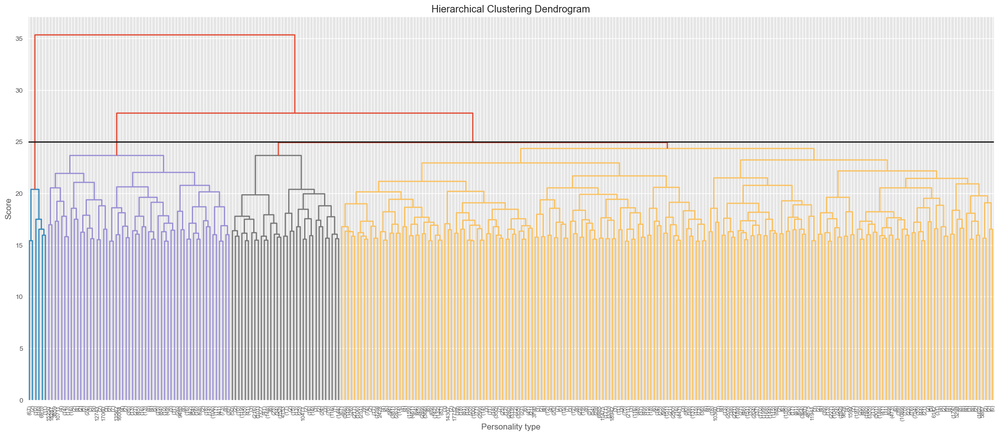

In [25]:
'''generate the linkage matrix'''
Z = linkage(sample, 'complete') # complete distance produces more meaningfull clusters in this case
'''set cut-off'''
max_d = 24.95

'''plot the dendogram'''
plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Personality type')
plt.ylabel('Score')
dendrogram(
    Z,
    truncate_mode='lastp',  # show only the last p merged clusters
    p=300,                  # Try changing values of p
    leaf_rotation=90.,      # rotates the x axis labels
    leaf_font_size=8.,      # font size for the x axis labels
#    color_threshold = max_d
)
plt.axhline(y=max_d, c='k')
plt.show()

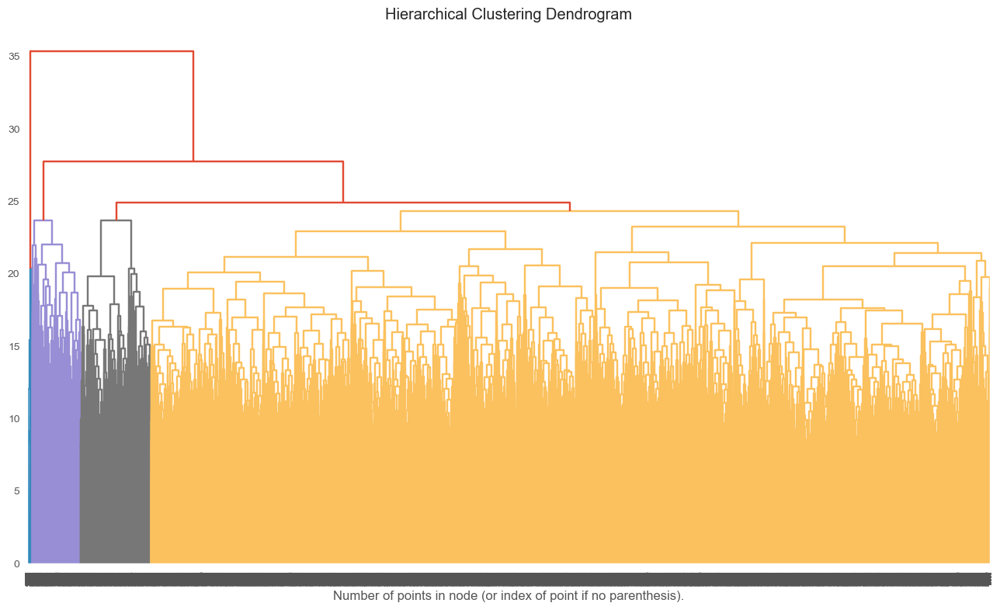

In [26]:
# Create Dendrogram

def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)


# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, linkage='complete')

model = model.fit(sample)
plt.title("Hierarchical Clustering Dendrogram")
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode="level", p=100)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [27]:
k_list = [4,5,8,9]

In [28]:
y_kmeans = pd.DataFrame()

In [29]:
for k in k_list:
    model = KMeans(
            n_clusters=k,
            init='k-means++',
    #         n_jobs=-1,
            random_state=1)
    
    model = model.fit(X)
    y = model.predict(X)
    y = pd.DataFrame(y,columns = [f'cluster_for_k_{k}'])
    y_kmeans = pd.concat([y_kmeans,y],axis=1)
y_kmeans.head()

,cluster_for_k_4,cluster_for_k_5,cluster_for_k_8,cluster_for_k_9
0,2,2,0,0
1,3,0,1,7
2,3,0,1,7
3,3,3,0,5
4,2,2,6,6


In [30]:
y_kmeans.head(60)

,cluster_for_k_4,cluster_for_k_5,cluster_for_k_8,cluster_for_k_9
0,2,2,0,0
1,3,0,1,7
2,3,0,1,7
3,3,3,0,5
4,2,2,6,6
5,2,2,6,7
6,0,4,0,0
7,2,2,6,6
8,2,2,0,0
9,3,3,7,1


In [31]:
y_kmeans.shape

(1013481, 4)

In [32]:
pca = PCA()
pca.fit(X)

PCA()

In [33]:
explained_variance = pca.explained_variance_ratio_
cumulative_variance = explained_variance.cumsum()
n_components = (cumulative_variance < 0.80).sum() + 1
n_components

27

In [34]:
cumulative_variance

array([0.15256243, 0.25878276, 0.33836649, 0.39918996, 0.45623346,
       0.49697643, 0.52164913, 0.54318486, 0.56246399, 0.58123497,
       0.59902241, 0.61633024, 0.63237793, 0.64790967, 0.66277812,
       0.67741488, 0.69113893, 0.70453836, 0.71748825, 0.72979913,
       0.74190357, 0.75384209, 0.76551419, 0.77666655, 0.787677  ,
       0.79861196, 0.8093248 , 0.81965895, 0.82983693, 0.8399234 ,
       0.8498238 , 0.85953758, 0.86913917, 0.87865849, 0.88808997,
       0.89717372, 0.90603399, 0.91478489, 0.92342038, 0.93193214,
       0.94016737, 0.94826881, 0.95625633, 0.96333128, 0.97023837,
       0.97702637, 0.98337518, 0.98935254, 0.99488707, 1.        ])

In [35]:
# for visualazitaion purposes we will use 3 PCA even though it cointains the 33% of the information
n_components = 3

In [36]:
cluster_X = pd.concat([X,y_kmeans],axis=1)
cluster_X.head(50)

,I am the life of the party,I dont talk a lot,I feel comfortable around people,I keep in the background,I start conversations,I have little to say,I talk to a lot of different people at parties,I dont like to draw attention to myself,I dont mind being the center of attention,I am quiet around strangers.,I get stressed out easily,I am relaxed most of the time,I worry about things,I seldom feel blue,I am easily disturbed,I get upset easily,I change my mood a lot,I have frequent mood swings,I get irritated easily,I often feel blue,I feel little concern for others,I am interested in people,I insult people,I sympathize with others feelings,I am not interested in other peoples problems,I have a soft heart,I am not really interested in others,I take time out for others,I feel others emotions,I make people feel at ease,I am always prepared,I leave my belongings around,I pay attention to details,I make a mess of things,I get chores done right away,I often forget to put things back in their proper place,I like order,I shirk my duties,I follow a schedule,I am exacting in my work.,I have a rich vocabulary,I have difficulty understanding abstract ideas,I have a vivid imagination,I am not interested in abstract ideas,I have excellent ideas,I do not have a good imagination,I am quick to understand things,I use difficult words,I spend time reflecting on things,I am full of ideas,cluster_for_k_4,cluster_for_k_5,cluster_for_k_8,cluster_for_k_9
0,4.0,1.0,5.0,2.0,5.0,1.0,5.0,2.0,4.0,1.0,1.0,4.0,4.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,2.0,5.0,2.0,4.0,2.0,3.0,2.0,4.0,3.0,4.0,3.0,4.0,3.0,2.0,2.0,4.0,4.0,2.0,4.0,4.0,5.0,1.0,4.0,1.0,4.0,1.0,5.0,3.0,4.0,5.0,2.0,2.0,0.0,0.0
1,3.0,5.0,3.0,4.0,3.0,3.0,2.0,5.0,1.0,5.0,2.0,3.0,4.0,1.0,3.0,1.0,2.0,1.0,3.0,1.0,1.0,4.0,1.0,5.0,1.0,5.0,3.0,4.0,5.0,3.0,3.0,2.0,5.0,3.0,3.0,1.0,3.0,3.0,5.0,3.0,1.0,2.0,4.0,2.0,3.0,1.0,4.0,2.0,5.0,3.0,3.0,0.0,1.0,7.0
2,2.0,3.0,4.0,4.0,3.0,2.0,1.0,3.0,2.0,5.0,4.0,4.0,4.0,2.0,2.0,2.0,2.0,2.0,1.0,3.0,1.0,4.0,1.0,4.0,2.0,4.0,1.0,4.0,4.0,3.0,4.0,2.0,2.0,2.0,3.0,3.0,4.0,2.0,4.0,2.0,5.0,1.0,2.0,1.0,4.0,2.0,5.0,3.0,4.0,4.0,3.0,0.0,1.0,7.0
3,2.0,2.0,2.0,3.0,4.0,2.0,2.0,4.0,1.0,4.0,3.0,3.0,3.0,2.0,3.0,2.0,2.0,2.0,4.0,3.0,2.0,4.0,3.0,4.0,2.0,4.0,2.0,4.0,3.0,4.0,2.0,4.0,4.0,4.0,1.0,2.0,2.0,3.0,1.0,4.0,4.0,2.0,5.0,2.0,3.0,1.0,4.0,4.0,3.0,3.0,3.0,3.0,0.0,5.0
4,3.0,3.0,3.0,3.0,5.0,3.0,3.0,5.0,3.0,4.0,1.0,5.0,5.0,3.0,1.0,1.0,1.0,1.0,3.0,2.0,1.0,5.0,1.0,5.0,1.0,3.0,1.0,5.0,5.0,3.0,5.0,1.0,5.0,1.0,3.0,1.0,5.0,1.0,5.0,5.0,5.0,1.0,5.0,1.0,5.0,1.0,5.0,3.0,5.0,5.0,2.0,2.0,6.0,6.0
5,3.0,3.0,4.0,2.0,4.0,2.0,2.0,3.0,3.0,4.0,3.0,4.0,3.0,2.0,2.0,1.0,2.0,1.0,2.0,2.0,2.0,3.0,1.0,4.0,2.0,3.0,2.0,3.0,4.0,4.0,3.0,2.0,4.0,1.0,3.0,2.0,4.0,3.0,4.0,3.0,5.0,1.0,5.0,1.0,3.0,1.0,5.0,4.0,5.0,2.0,2.0,2.0,6.0,7.0
6,4.0,3.0,4.0,3.0,3.0,3.0,5.0,3.0,4.0,3.0,2.0,4.0,4.0,2.0,4.0,2.0,2.0,2.0,4.0,4.0,1.0,2.0,1.0,5.0,3.0,5.0,3.0,4.0,4.0,5.0,3.0,2.0,4.0,2.0,1.0,4.0,4.0,2.0,2.0,5.0,5.0,2.0,4.0,3.0,4.0,1.0,5.0,5.0,4.0,4.0,0.0,4.0,0.0,0.0
7,3.0,1.0,5.0,2.0,5.0,2.0,5.0,2.0,3.0,2.0,2.0,4.0,2.0,4.0,2.0,1.0,2.0,1.0,1.0,1.0,2.0,5.0,2.0,4.0,3.0,2.0,2.0,4.0,4.0,4.0,5.0,1.0,5.0,1.0,4.0,2.0,3.0,2.0,5.0,5.0,4.0,1.0,3.0,1.0,5.0,1.0,4.0,3.0,4.0,5.0,2.0,2.0,6.0,6.0
8,2.0,2.0,3.0,3.0,4.0,2.0,2.0,2.0,4.0,4.0,3.0,4.0,4.0,1.0,2.0,2.0,3.0,2.0,3.0,4.0,1.0,5.0,1.0,5.0,1.0,3.0,1.0,4.0,4.0,4.0,3.0,3.0,4.0,0.0,3.0,4.0,1.0,2.0,1.0,4.0,4.0,1.0,5.0,1.0,4.0,1.0,5.0,2.0,5.0,5.0,2.0,2.0,0.0,0.0
9,1.0,5.0,3.0,5.0,2.0,3.0,2.0,4.0,5.0,4.0,3.0,3.0,3.0,3.0,4.0,3.0,3.0,3.0,3.0,3.0,5.0,3.0,5.0,1.0,5.0,3.0,4.0,2.0,3.0,2.0,2.0,5.0,1.0,5.0,1.0,4.0,3.0,4.0,2.0,2.0,3.0,1.0,3.0,1.0,3.0,3.0,4.0,3.0,3.0,3.0,3.0,3.0,7.0,1.0


In [37]:
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(X)
X_pca

array([[-5.44574127, -1.488372  ,  2.41130828],
       [ 0.25856765,  3.04892396, -3.08804881],
       [-0.61950957,  2.15191691, -1.48041913],
       ...,
       [-1.50981301, -3.39159991,  4.90563139],
       [ 2.306573  ,  1.12279151, -2.27648139],
       [-2.61648155, -2.39876745,  1.30668302]])

In [38]:
pca_df = pd.DataFrame(X_pca, columns=[f'PC{i+1}' for i in range(n_components)])
pca_df.head()

,PC1,PC2,PC3
0,-5.445741,-1.488372,2.411308
1,0.258568,3.048924,-3.088049
2,-0.619510,2.151917,-1.480419
3,1.128804,0.248461,2.000361
4,-4.694848,2.474229,-4.478377


In [39]:
pca_final_df = pd.concat([pca_df,y_kmeans],axis=1)
pca_final_df.head(20)

,PC1,PC2,PC3,cluster_for_k_4,cluster_for_k_5,cluster_for_k_8,cluster_for_k_9
0,-5.445741,-1.488372,2.411308,2,2,0,0
1,0.258568,3.048924,-3.088049,3,0,1,7
2,-0.619510,2.151917,-1.480419,3,0,1,7
3,1.128804,0.248461,2.000361,3,3,0,5
4,-4.694848,2.474229,-4.478377,2,2,6,6
5,-2.652654,2.449489,-0.343984,2,2,6,7
6,-1.489678,-0.970841,0.192686,0,4,0,0
7,-7.013827,2.155953,-0.276763,2,2,6,6
8,-1.799282,-0.748611,0.114886,2,2,0,0
9,5.103624,1.820244,6.100057,3,3,7,1


# 3D Visuals for different clusters

In [45]:
sample1 = pca_final_df.sample(n = 20000)

In [46]:
#k=4

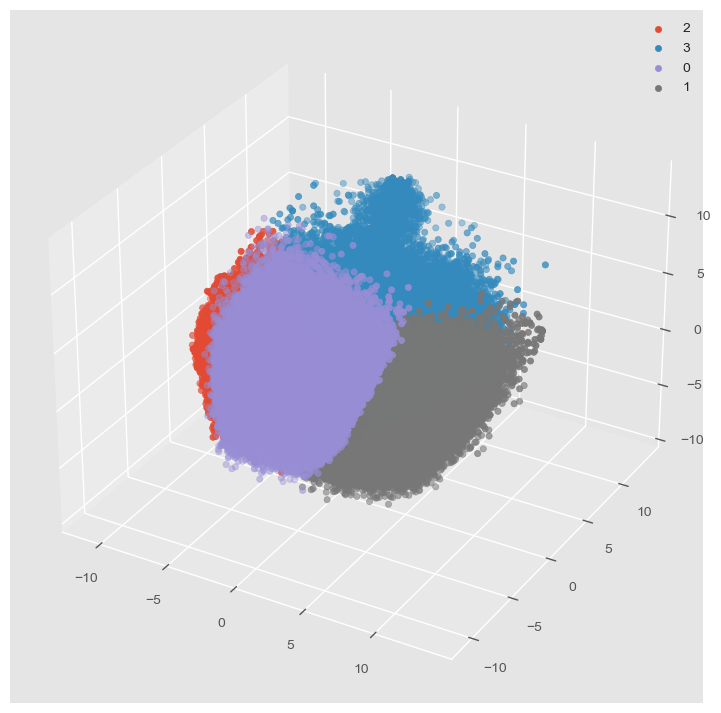

In [41]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

for s in pca_final_df.cluster_for_k_4.unique():
    ax.scatter(pca_final_df.PC1[pca_final_df.cluster_for_k_4 ==s],pca_final_df.PC2[pca_final_df.cluster_for_k_4==s],pca_final_df.PC3[pca_final_df.cluster_for_k_4==s],label=s)

ax.legend()

In [42]:
from IPython.display import HTML
from matplotlib import animation

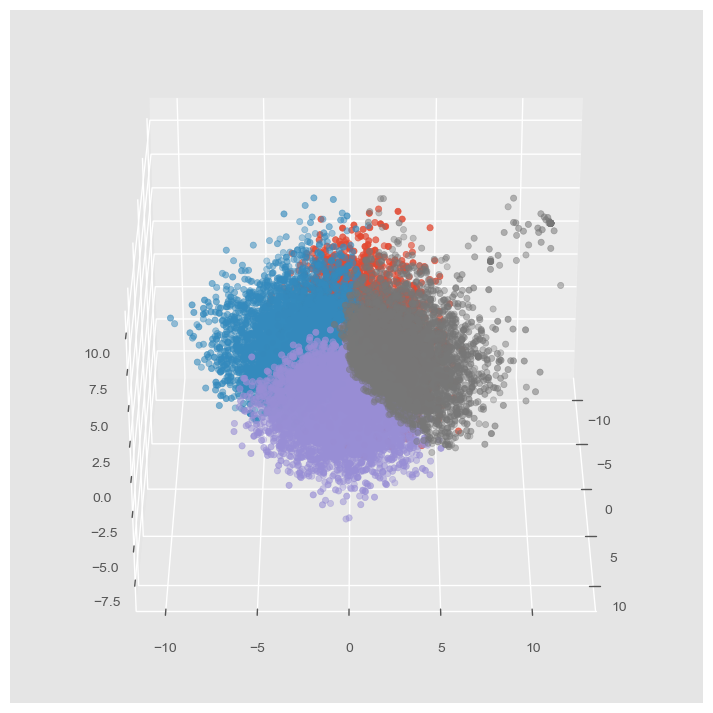

In [47]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

for s in sample1.cluster_for_k_4.unique():
    ax.scatter(sample1.PC1[sample1.cluster_for_k_4 ==s],sample1.PC2[sample1.cluster_for_k_4==s],sample1.PC3[sample1.cluster_for_k_4==s],label=s)

def animate(frame):
  ax.view_init(30, frame/4)
  plt.pause(.001)
  return fig

anim = animation.FuncAnimation(fig, animate, frames=300, interval=50)
HTML(anim.to_html5_video())

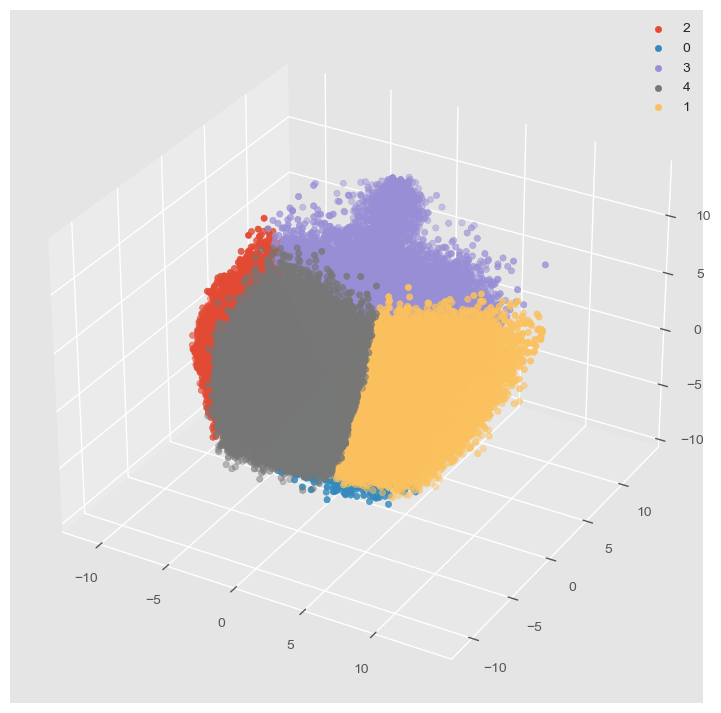

In [50]:
#k=5
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

for s in pca_final_df.cluster_for_k_5.unique():
    ax.scatter(pca_final_df.PC1[pca_final_df.cluster_for_k_5 ==s],pca_final_df.PC2[pca_final_df.cluster_for_k_5==s],pca_final_df.PC3[pca_final_df.cluster_for_k_5==s],label=s)

ax.legend()

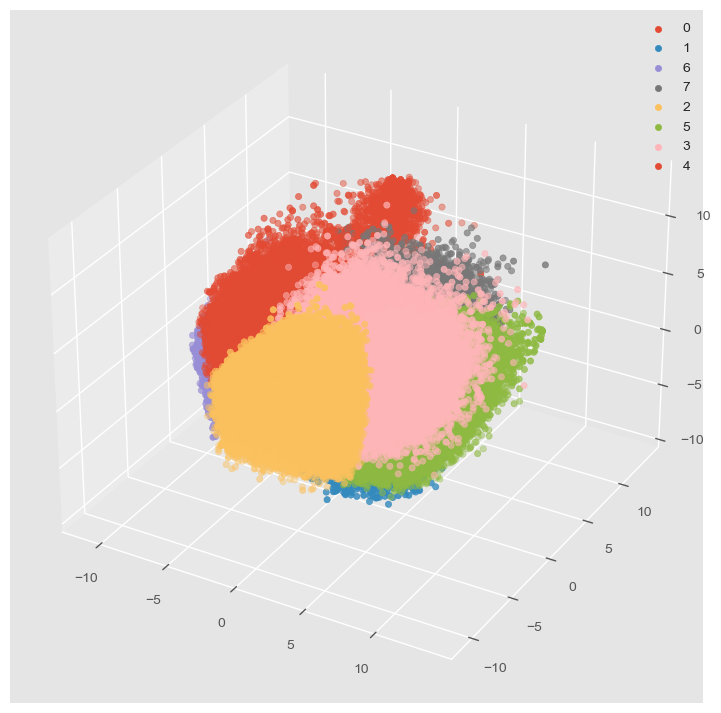

In [51]:
#k=8
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

for s in pca_final_df.cluster_for_k_8.unique():
    ax.scatter(pca_final_df.PC1[pca_final_df.cluster_for_k_8 ==s],pca_final_df.PC2[pca_final_df.cluster_for_k_8==s],pca_final_df.PC3[pca_final_df.cluster_for_k_8==s],label=s)

ax.legend()

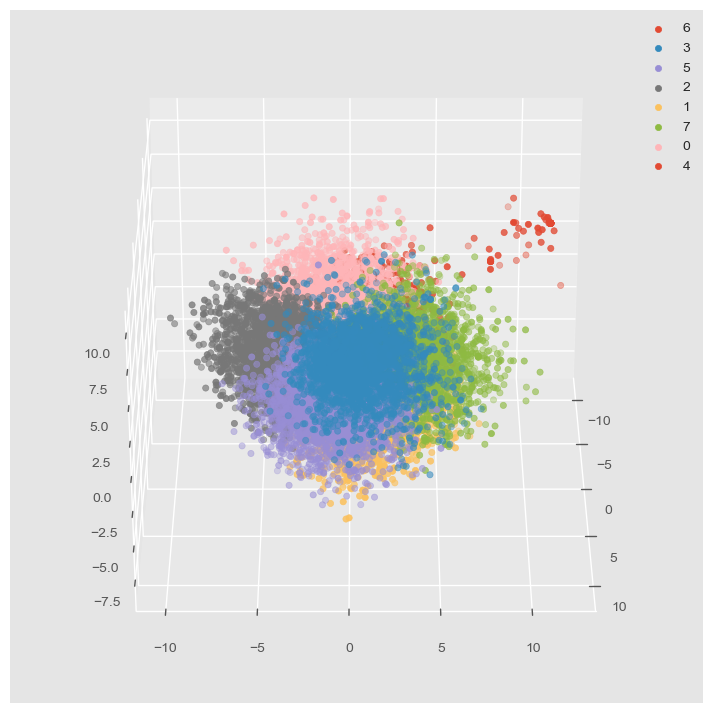

In [52]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

for s in sample1.cluster_for_k_8.unique():
    ax.scatter(sample1.PC1[sample1.cluster_for_k_8 ==s],sample1.PC2[sample1.cluster_for_k_8==s],sample1.PC3[sample1.cluster_for_k_8==s],label=s)

ax.legend()

def animate(frame):
  ax.view_init(30, frame/4)
  plt.pause(.001)
  return fig

anim = animation.FuncAnimation(fig, animate, frames=300, interval=50)
HTML(anim.to_html5_video())

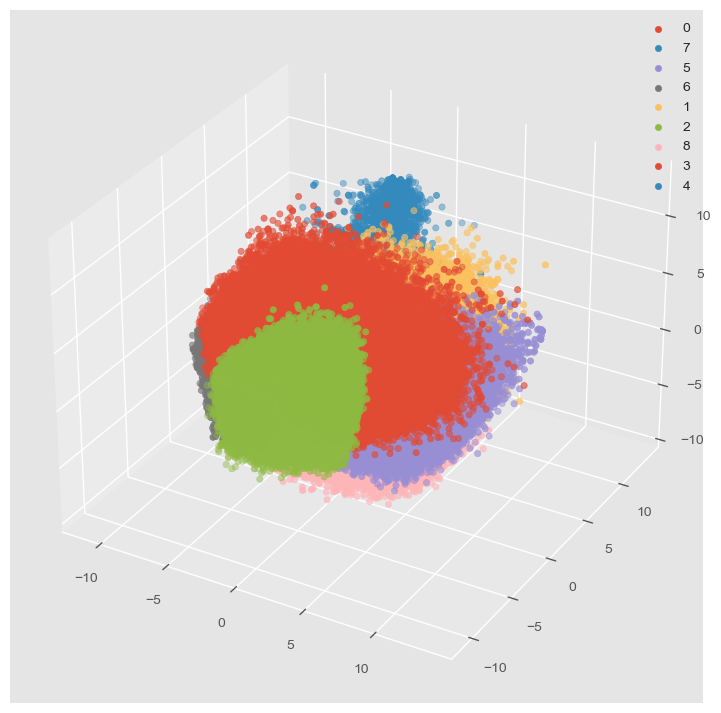

In [53]:
#k=9
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

for s in pca_final_df.cluster_for_k_9.unique():
    ax.scatter(pca_final_df.PC1[pca_final_df.cluster_for_k_9 ==s],pca_final_df.PC2[pca_final_df.cluster_for_k_9==s],pca_final_df.PC3[pca_final_df.cluster_for_k_9==s],label=s)

ax.legend()

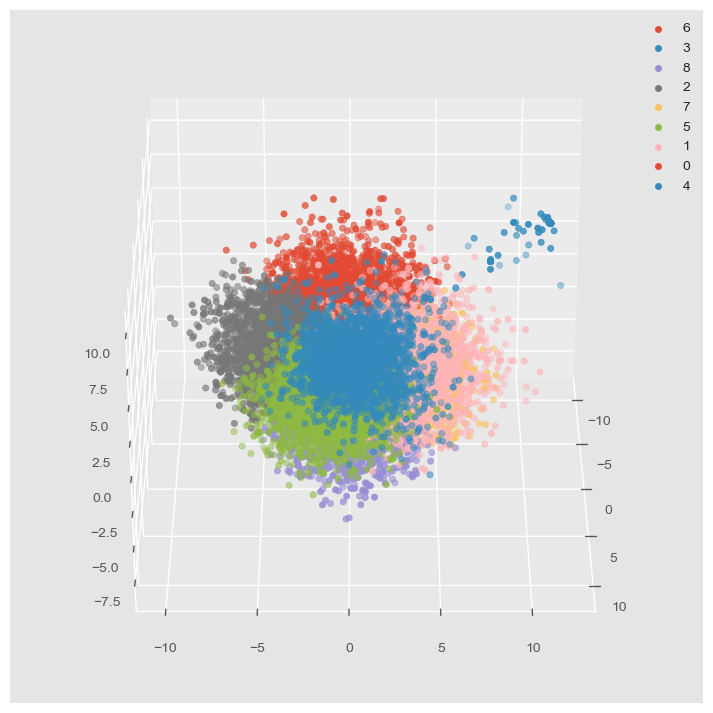

In [54]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

for s in sample1.cluster_for_k_9.unique():
    ax.scatter(sample1.PC1[sample1.cluster_for_k_9 ==s],sample1.PC2[sample1.cluster_for_k_9==s],sample1.PC3[sample1.cluster_for_k_9==s],label=s)

ax.legend()

def animate(frame):
  ax.view_init(30, frame/4)
  plt.pause(.001)
  return fig

anim = animation.FuncAnimation(fig, animate, frames=300, interval=50)
HTML(anim.to_html5_video())

<Axes: xlabel='PC1', ylabel='PC2'>

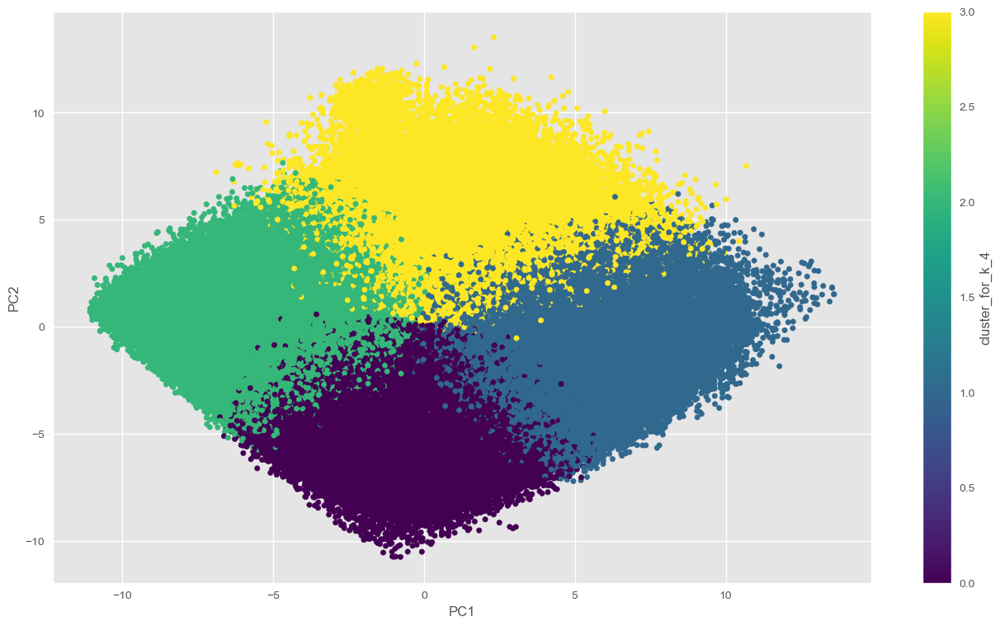

In [55]:
pca_final_df.plot.scatter(x = 'PC1', y = 'PC2', c = "cluster_for_k_4", colormap='viridis')

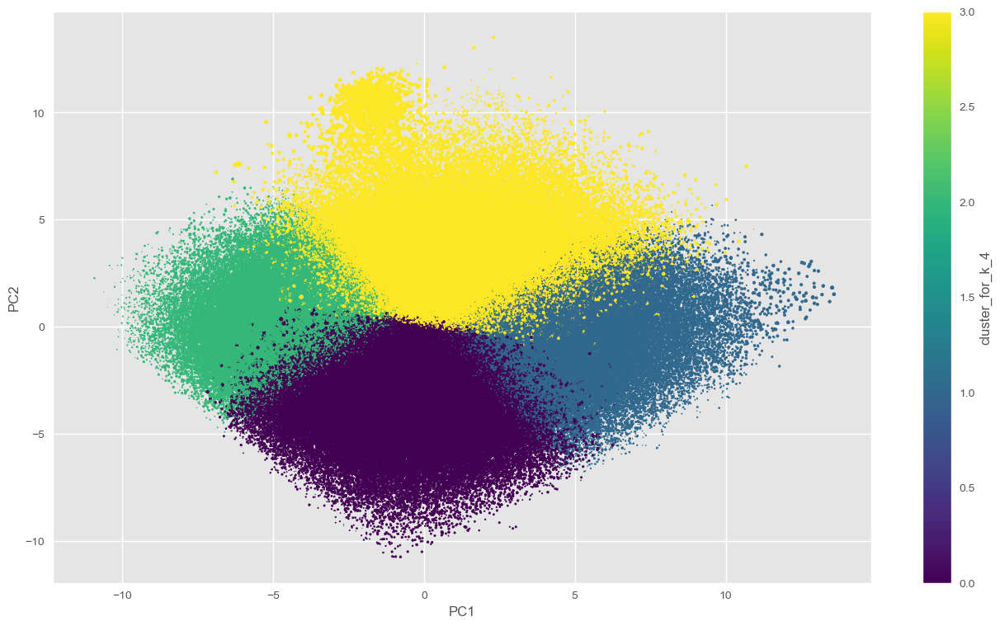

In [56]:
pca_final_df.plot.scatter(x = 'PC1', y = 'PC2',s = 'PC3' , c = "cluster_for_k_4", colormap='viridis')
None

<Axes: xlabel='PC1', ylabel='PC2'>

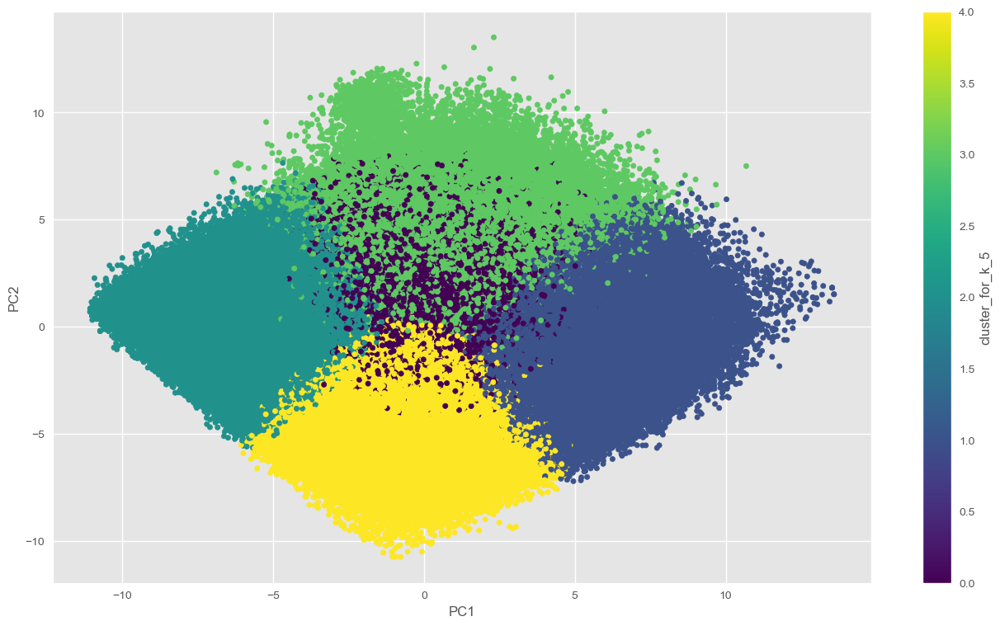

In [57]:
pca_final_df.plot.scatter(x = 'PC1', y = 'PC2', c = "cluster_for_k_5", colormap='viridis')

<Axes: xlabel='PC1', ylabel='PC2'>

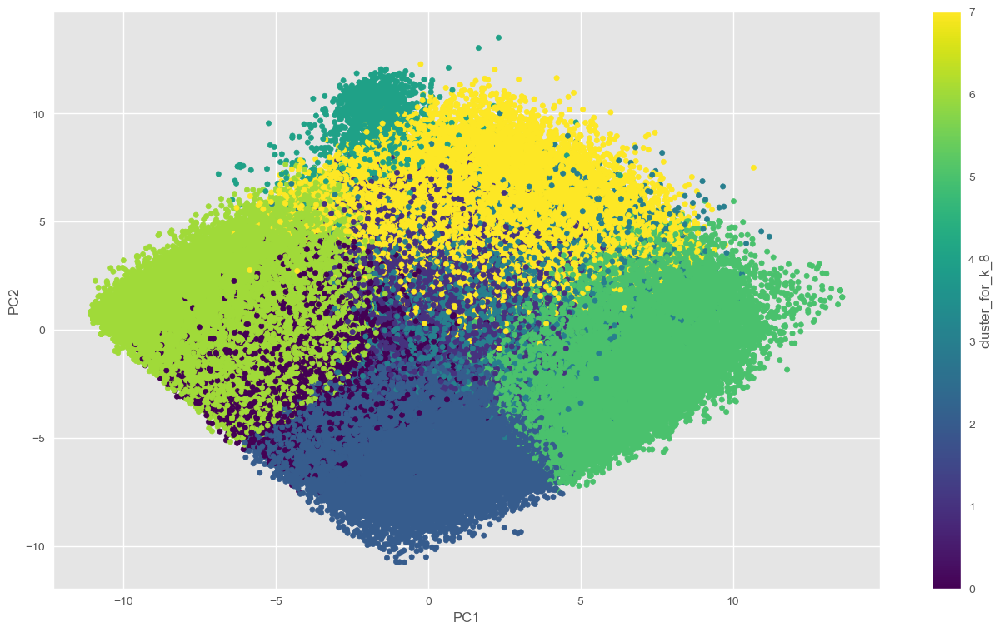

In [58]:
pca_final_df.plot.scatter(x = 'PC1', y = 'PC2', c = "cluster_for_k_8", colormap='viridis')

<Axes: xlabel='PC1', ylabel='PC2'>

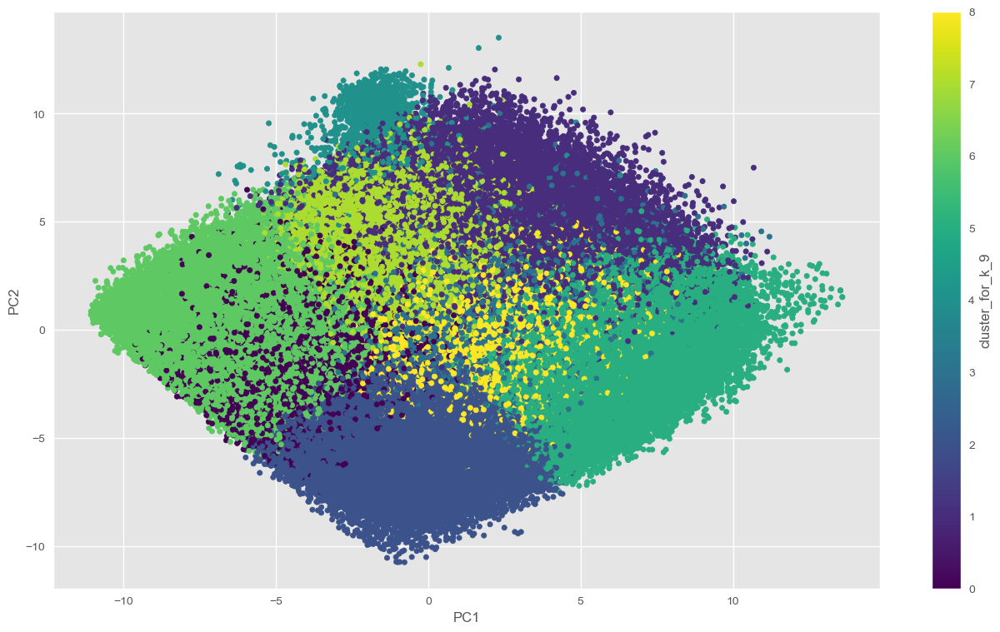

In [59]:
pca_final_df.plot.scatter(x = 'PC1', y = 'PC2', c = "cluster_for_k_9", colormap='viridis')

In [60]:
cumulative_variance_df = pd.DataFrame(cumulative_variance)

In [61]:
explained_variance_df =pd.DataFrame(explained_variance)

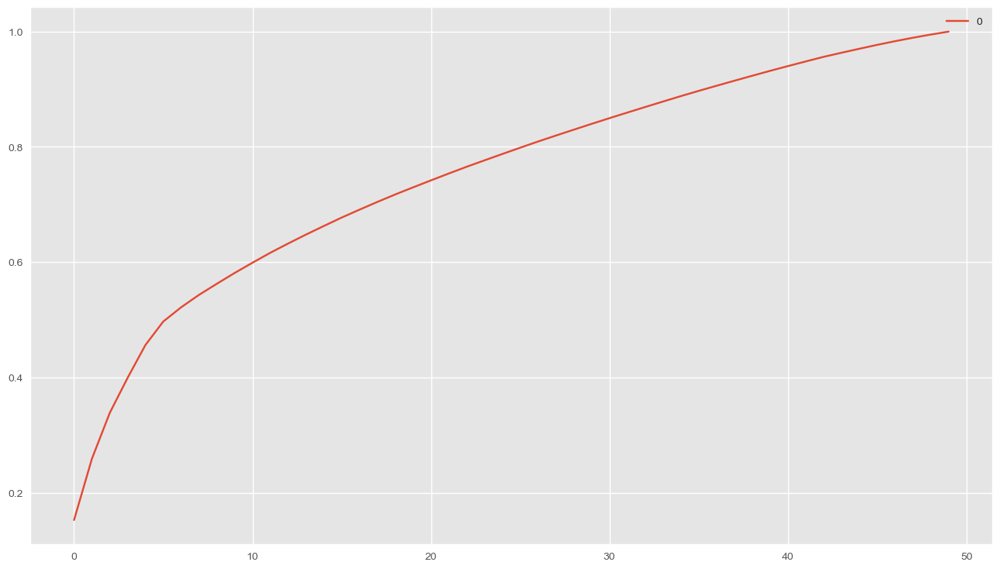

In [62]:
fig = cumulative_variance_df.plot()

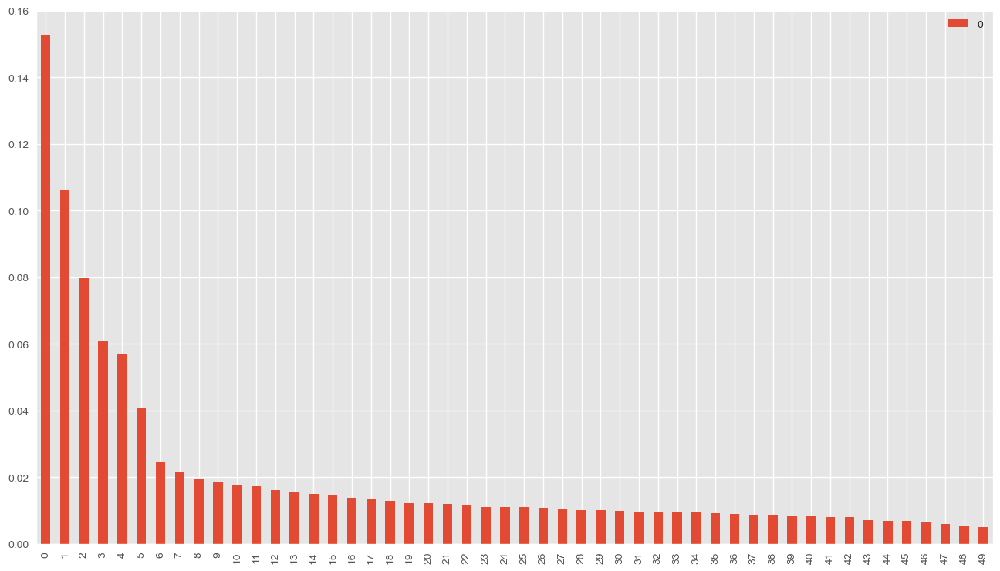

In [63]:
fig = explained_variance_df.plot(kind='bar')

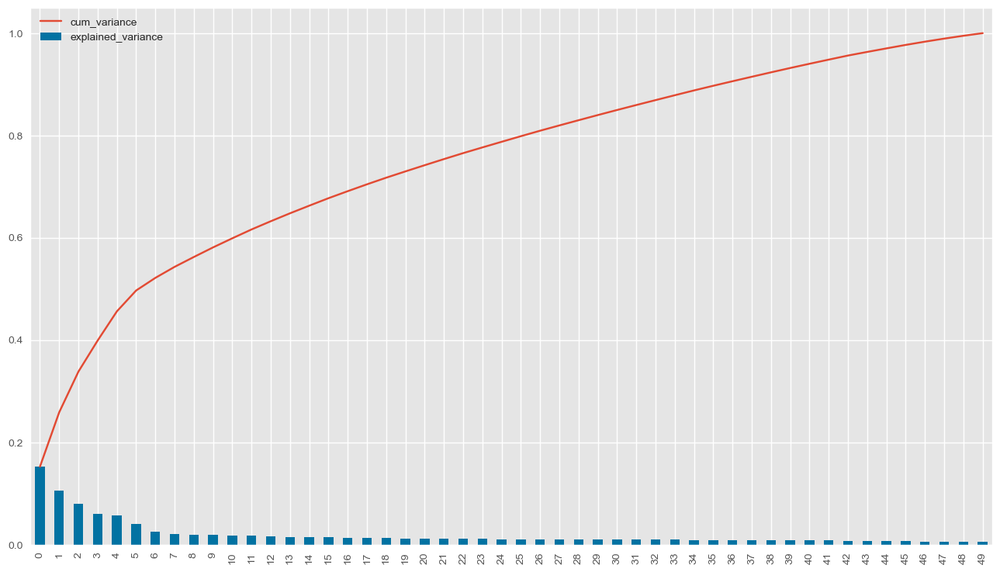

In [64]:
fig, ax = plt.subplots()

cumulative_variance_df.plot(ax=ax, label='cum_variance')
explained_variance_df.plot(ax=ax, label='explained_variance',kind='bar',color='b')
L = plt.legend()
L.get_texts()[0].set_text('cum_variance')
L.get_texts()[1].set_text('explained_variance')
None

In [65]:
cluster_X.groupby('cluster_for_k_5').mean()

,I am the life of the party,I dont talk a lot,I feel comfortable around people,I keep in the background,I start conversations,I have little to say,I talk to a lot of different people at parties,I dont like to draw attention to myself,I dont mind being the center of attention,I am quiet around strangers.,I get stressed out easily,I am relaxed most of the time,I worry about things,I seldom feel blue,I am easily disturbed,I get upset easily,I change my mood a lot,I have frequent mood swings,I get irritated easily,I often feel blue,I feel little concern for others,I am interested in people,I insult people,I sympathize with others feelings,I am not interested in other peoples problems,I have a soft heart,I am not really interested in others,I take time out for others,I feel others emotions,I make people feel at ease,I am always prepared,I leave my belongings around,I pay attention to details,I make a mess of things,I get chores done right away,I often forget to put things back in their proper place,I like order,I shirk my duties,I follow a schedule,I am exacting in my work.,I have a rich vocabulary,I have difficulty understanding abstract ideas,I have a vivid imagination,I am not interested in abstract ideas,I have excellent ideas,I do not have a good imagination,I am quick to understand things,I use difficult words,I spend time reflecting on things,I am full of ideas,cluster_for_k_4,cluster_for_k_8,cluster_for_k_9
cluster_for_k_5,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0.0,2.646884,2.771293,3.289729,3.139309,3.281040,2.395946,2.773051,3.419277,2.958181,3.557317,3.286635,3.164615,3.849519,2.665316,2.842311,2.837792,3.046126,2.679478,3.089788,2.771551,2.250134,3.835512,2.250289,3.930820,2.267056,3.748018,2.192761,3.694487,3.793067,3.594340,3.305678,2.925056,3.977257,2.610627,2.629473,2.819521,3.703119,2.457711,3.207356,3.594594,3.654764,2.076623,3.998820,1.999154,3.793472,1.896957,3.975837,3.182576,4.124752,3.958374,1.773722,1.891974,6.587721
1.0,2.642497,2.782149,3.282263,3.151061,3.269469,2.406334,2.761408,3.418072,2.964848,3.564974,3.285677,3.164159,3.846047,2.660422,2.842450,2.844301,3.056445,2.689487,3.090024,2.783169,2.261244,3.829009,2.267096,3.925457,2.276739,3.735024,2.201684,3.684083,3.785244,3.587645,3.290066,2.939221,3.969521,2.627987,2.615014,2.843092,3.694673,2.476806,3.188860,3.584769,3.659496,2.074478,4.005359,1.997567,3.789543,1.894864,3.978782,3.186213,4.124359,3.960176,1.047086,4.563390,4.854102
2.0,2.654819,2.765877,3.297531,3.132349,3.285999,2.395170,2.778501,3.412412,2.962521,3.548431,3.280988,3.166686,3.842206,2.669402,2.839897,2.835585,3.040196,2.673455,3.079256,2.761115,2.244572,3.839082,2.252688,3.932654,2.264948,3.748270,2.186559,3.696528,3.794532,3.597562,3.305551,2.923733,3.978891,2.604734,2.635732,2.823526,3.700491,2.449599,3.210748,3.592656,3.655734,2.076851,3.997964,2.001840,3.795763,1.891284,3.977104,3.179554,4.121450,3.959996,1.890138,4.290758,4.449401
3.0,2.642429,2.784607,3.278884,3.150328,3.267101,2.408571,2.765589,3.413593,2.963930,3.563510,3.285535,3.164669,3.841988,2.663151,2.846500,2.842658,3.048702,2.683558,3.091447,2.776425,2.264046,3.821568,2.266535,3.918173,2.278011,3.735844,2.203370,3.675057,3.779173,3.584667,3.294645,2.933681,3.975523,2.621555,2.620387,2.836487,3.693344,2.471417,3.194014,3.588171,3.656623,2.071882,4.000529,1.998199,3.795782,1.895325,3.978049,3.187517,4.123866,3.958920,2.904366,4.919127,2.655789
4.0,2.650938,2.766111,3.289942,3.134151,3.277712,2.402135,2.776690,3.411355,2.968205,3.551240,3.290869,3.164984,3.851090,2.660577,2.845065,2.845621,3.059491,2.690991,3.092849,2.776642,2.259126,3.828055,2.264621,3.927869,2.269904,3.745768,2.197208,3.692254,3.790703,3.594833,3.293486,2.931011,3.974781,2.625525,2.627003,2.837527,3.697678,2.471923,3.200077,3.591986,3.648475,2.078394,3.998371,2.001863,3.790544,1.894815,3.973174,3.178384,4.121360,3.955061,0.065156,1.754518,2.105103


**heatmap for 5 clusters**

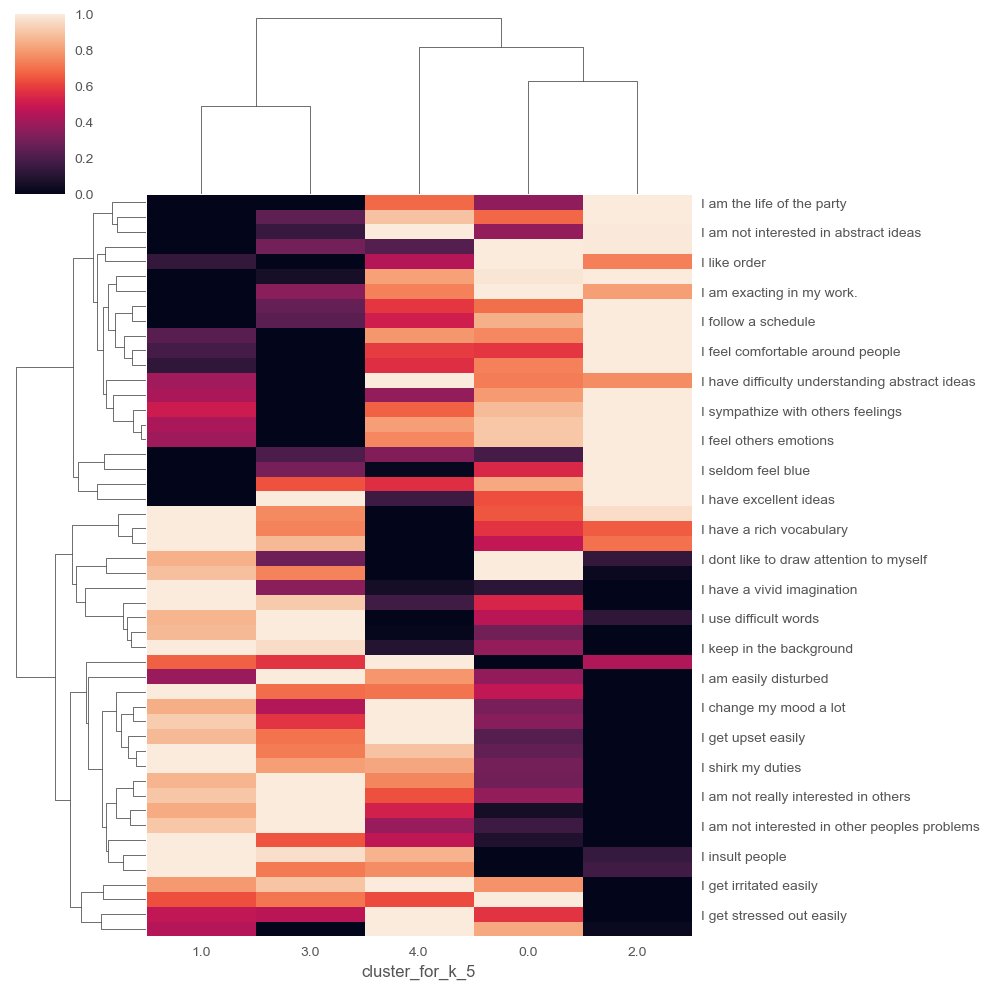

In [66]:
#mean
sns.clustermap(cluster_X.groupby('cluster_for_k_5').mean()\
               .drop(['cluster_for_k_4','cluster_for_k_8','cluster_for_k_9'],axis=1).T,standard_scale=0)
None

**heatmap for 4 clusters**

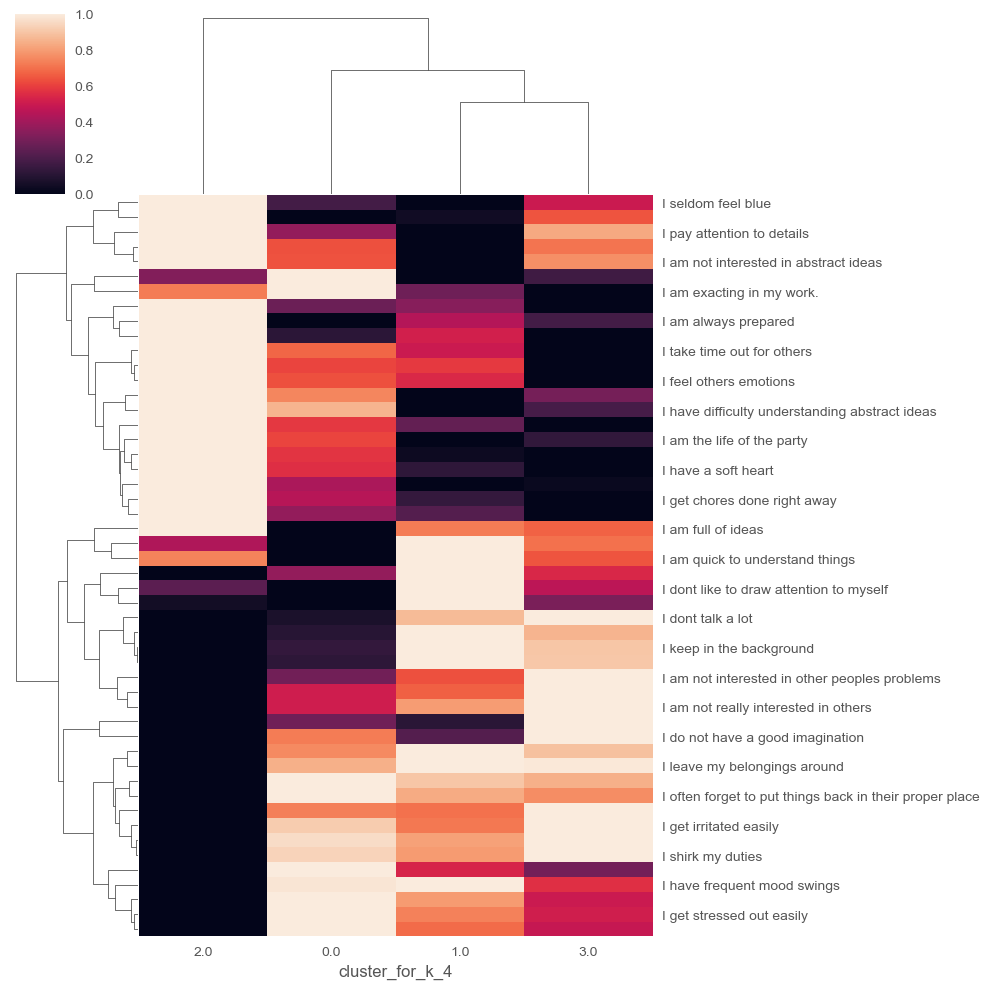

In [67]:
sns.clustermap(cluster_X.groupby('cluster_for_k_4').mean()\
               .drop(['cluster_for_k_5','cluster_for_k_8','cluster_for_k_9'],axis=1).T,standard_scale=0)
None

**heatmap for 8 clusters**

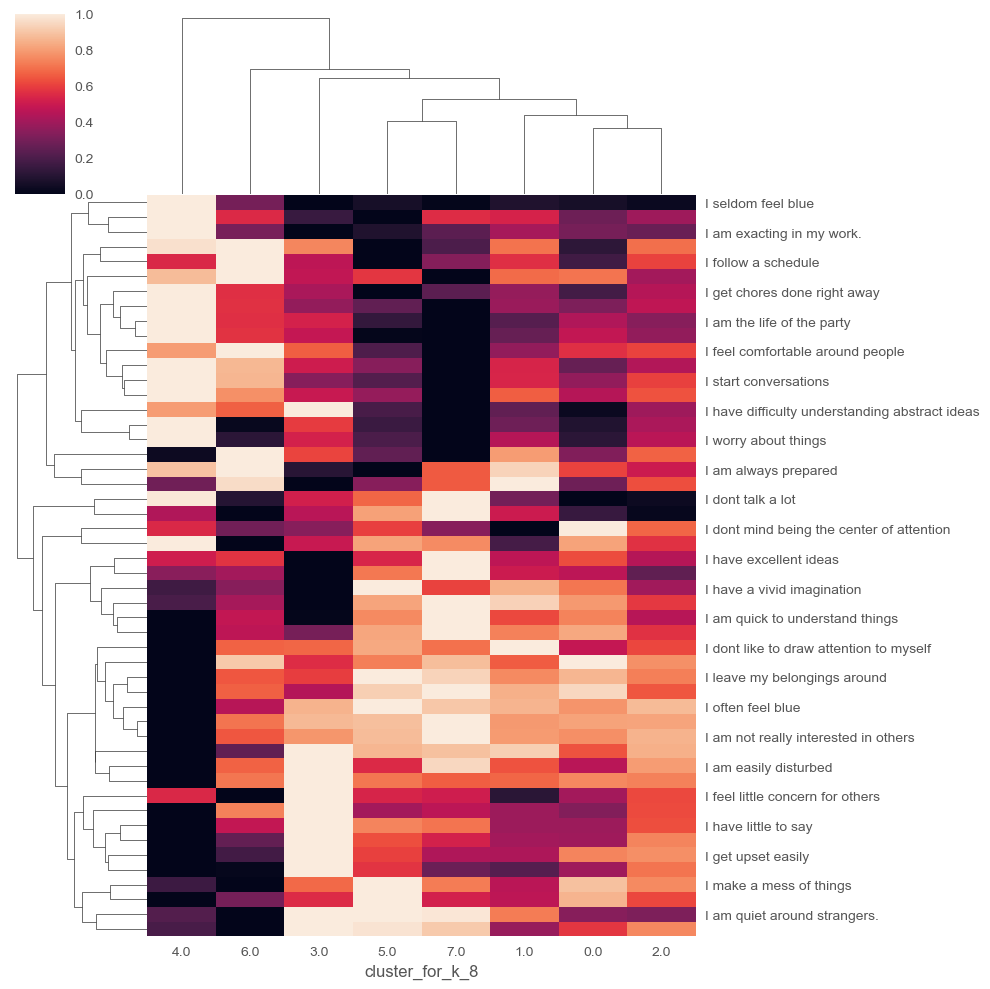

In [68]:
sns.clustermap(cluster_X.groupby('cluster_for_k_8').mean()\
               .drop(['cluster_for_k_5','cluster_for_k_4','cluster_for_k_9'],axis=1).T,standard_scale=0)
None

**heatmap for 9 clusters**

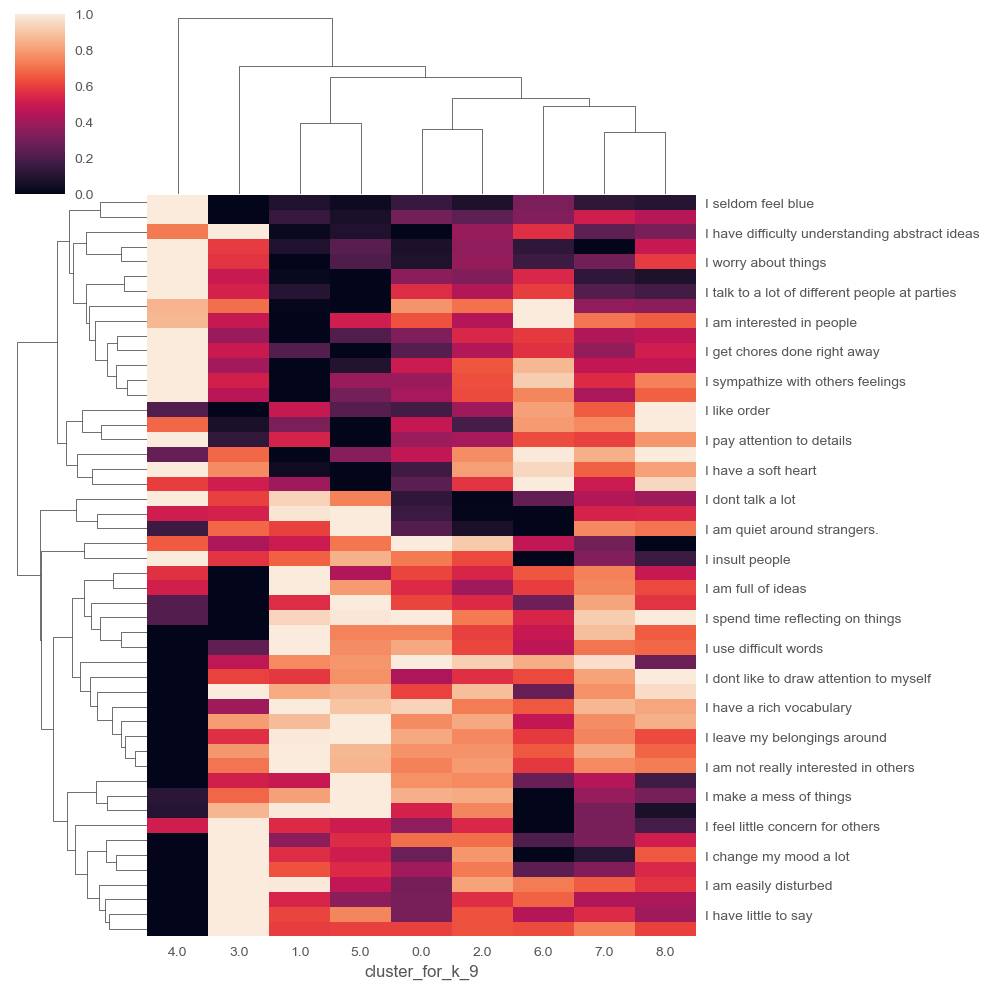

In [69]:
sns.clustermap(cluster_X.groupby('cluster_for_k_9').mean()\
               .drop(['cluster_for_k_5','cluster_for_k_8','cluster_for_k_4'],axis=1).T,standard_scale=0)
None

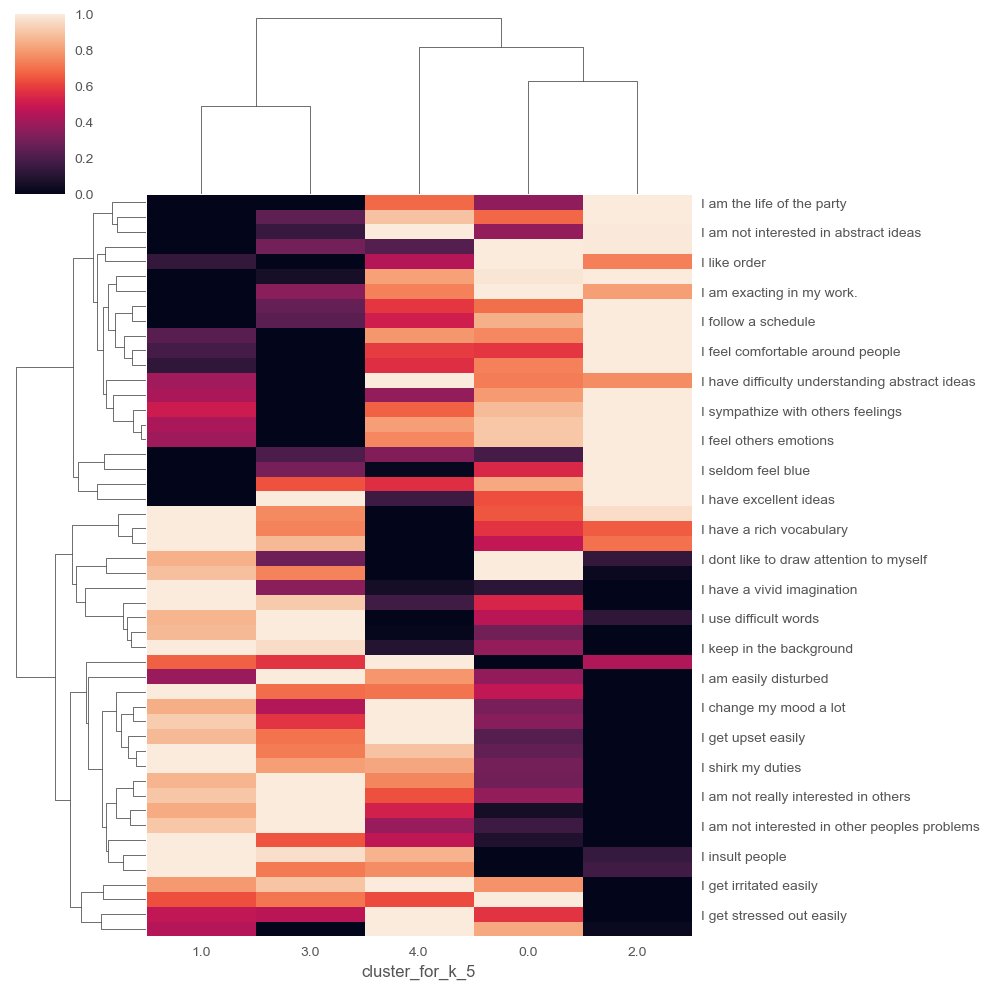

In [70]:
sns.clustermap(cluster_X.groupby('cluster_for_k_5').mean()\
               .drop(['cluster_for_k_9','cluster_for_k_8','cluster_for_k_4'],axis=1).T,standard_scale=0)
None